# This notebook looks at the impact of random force errors on the M1S3 surface shape

o. nonrepeatable force error is assumed to be +/- 1N

o. repeatable force error is assumed to be +/- 10N

Summary:

RMS=1N random force error results in ~15nm astigmatism and ~5nm focus.

RMS=10N random force error results in ~150nm astigmatism and ~50nm focus.

In [1]:
import numpy as np
import pandas as pd
import scipy.io

import matplotlib.pyplot as plt

plt.jet()

%matplotlib inline

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


<Figure size 640x480 with 0 Axes>

In [2]:
dataFolder = '/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents'

#read Afz (Fz influence matrix)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/Afz-13-Apr-2023.csv', header=None)
Afz = np.array(df)
print('Afz = ',Afz.shape)
# this is Afz only; it is 27685 x 170.

#read Fz Bending Modes & forces
df = pd.read_csv(dataFolder+'/influnce_matrix_files/U-13-Apr-2023.csv', header=None)
UMat = np.array(df)
print('U matrix', UMat.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/V-13-Apr-2023.csv', header=None)
VMat = np.array(df)
print('V matrix', VMat.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/S-13-Apr-2023.csv', header=None)
SMat = np.array(df)
print('S matrix', SMat.shape)

#read FEA nodes data
mat = scipy.io.loadmat(dataFolder+'/influnce_matrix_files/NodeXYZsurface_meters.mat')
nodeID = mat['NodeXYZsurface_meters'][:,0]
nodex = mat['NodeXYZsurface_meters'][:,2] #swap x/y to get to M1B
nodey = mat['NodeXYZsurface_meters'][:,1]
nodez = mat['NodeXYZsurface_meters'][:,3]
print('N node = ', len(nodeID))

############normalize bending modes to RMS = 1um ###################
UMat *= np.sqrt(UMat.shape[0])
for modeID in range(1, UMat.shape[1]+1):
    VMat[:, modeID-1] *= 1e-6/SMat[modeID-1, modeID-1]*np.sqrt(UMat.shape[0]) 
    #1e-6 due to meter to micron conversion

Afz =  (27685, 170)
U matrix (27685, 170)
V matrix (170, 170)
S matrix (170, 170)
N node =  27685


In [3]:
nnode, nact = Afz.shape

### Absolute force accuracy is +/- 1N

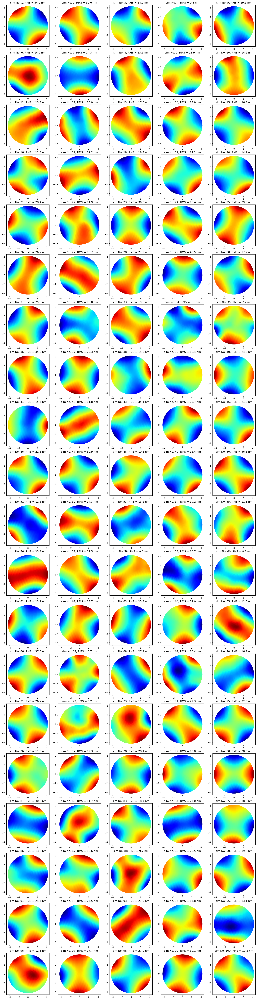

In [4]:
mu, sigma = 0, 1.0 # mean and standard deviation
nrow = 20

BMcoeff = np.zeros((5*nrow, nact))
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))

for i in range(5*nrow):
    irow = np.int8(i/5)
    icol = np.mod(i,5)

    f = np.random.normal(mu, sigma, nact)
    surf = Afz@f
    img = ax[irow][icol].scatter(nodex, nodey,10, surf)
    ax[irow][icol].set_title('sim No. %d, RMS = %.1f nm'%(i+1, np.std(surf)*1e9))
    BMcoeff[i,:] = UMat.transpose()@surf/nnode

In [5]:
#check the BM decomposition gives the same RMS as the influence matrix
np.sqrt(np.sum(BMcoeff[i,:]**2))

1.9211976520397385e-08

In [10]:
rms012 = [np.std(BMcoeff, axis=0)[i]*1e9 for i in range(3)]

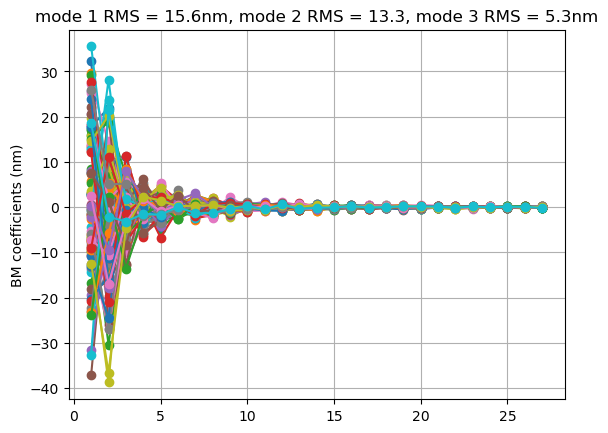

In [13]:
for i in range(nrow*5):
    plt.plot(np.arange(1, 27+1), BMcoeff[i,:27]*1e9,'-o', label='sim No. %d'%i)
    plt.ylabel('BM coefficients (nm)')
plt.title('mode 1 RMS = %.1fnm, mode 2 RMS = %.1f, mode 3 RMS = %.1fnm'%(rms012[0],rms012[1],rms012[2]))
plt.grid();

In [14]:
np.std(BMcoeff, axis=0)[:27]*1e9

array([15.57667335, 13.31668429,  5.32433464,  2.57936039,  2.22188684,
        1.1607646 ,  1.17615184,  0.92009942,  0.76890949,  0.41869757,
        0.37755425,  0.38460462,  0.34366361,  0.33480091,  0.21346266,
        0.20326435,  0.18419951,  0.16775668,  0.19518364,  0.16513476,
        0.12589652,  0.14047542,  0.11820139,  0.09708451,  0.09506003,
        0.10349069,  0.09036726])

### Absolute force accuracy is +/- 10N

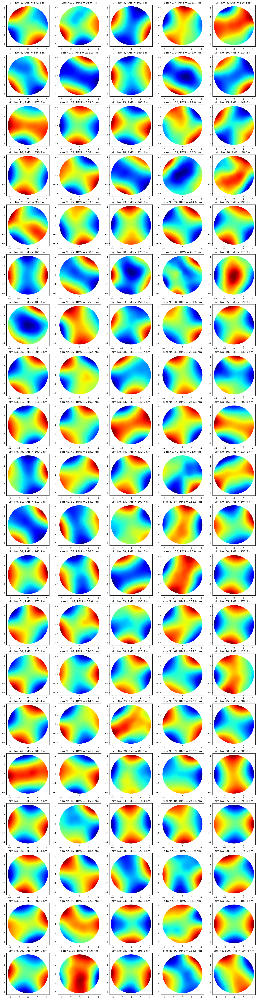

In [24]:
mu, sigma = 0, 10. # mean and standard deviation
nrow = 20

BMcoeff = np.zeros((5*nrow, nact))
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))

for i in range(5*nrow):
    irow = np.int8(i/5)
    icol = np.mod(i,5)

    f = np.random.normal(mu, sigma, nact)
    surf = Afz@f
    img = ax[irow][icol].scatter(nodex, nodey,10, surf)
    ax[irow][icol].set_title('sim No. %d, RMS = %.1f nm'%(i+1, np.std(surf)*1e9))
    BMcoeff[i,:] = UMat.transpose()@surf/nnode

In [25]:
rms012 = [np.std(BMcoeff, axis=0)[i]*1e9 for i in range(3)]

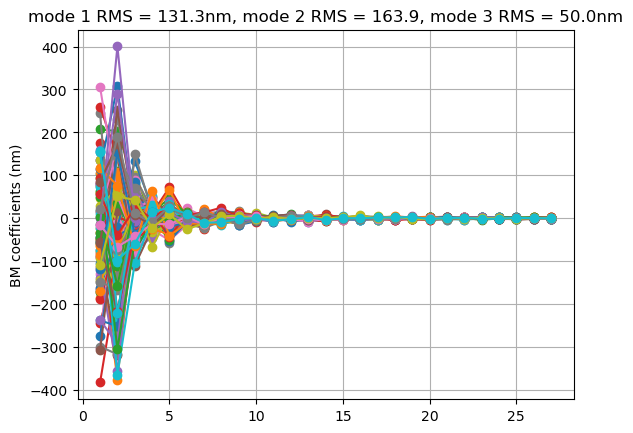

In [26]:
for i in range(nrow*5):
    plt.plot(np.arange(1, 27+1), BMcoeff[i,:27]*1e9,'-o', label='sim No. %d'%i)
    plt.ylabel('BM coefficients (nm)')
plt.title('mode 1 RMS = %.1fnm, mode 2 RMS = %.1f, mode 3 RMS = %.1fnm'%(rms012[0],rms012[1],rms012[2]))
plt.grid();

In [27]:
np.std(BMcoeff, axis=0)[:27]*1e9

array([131.29198656, 163.85011951,  49.99471879,  22.88733356,
        25.3833541 ,  10.4410562 ,  10.7663231 ,   7.57270054,
         7.23737347,   3.82676852,   3.52609292,   3.49837973,
         3.70548116,   3.07301708,   1.86023928,   1.91482617,
         1.64697618,   1.79253839,   1.60034369,   1.53297024,
         1.43788348,   1.17431943,   1.20996283,   0.98294542,
         1.04041037,   0.93347653,   0.92814554])